# Face Generation

In this project, we will define and train our own Generative Adversarial Network on a dataset of faces. The objective is to train a generator network to produce new images of faces that appear as realistic as possible!

The project will be divided into a series of tasks, including defining new architectures and training adversarial networks. 
We will use the CelebFaces Attributes Dataset (CelebA) to train our adversarial networks.

<img src='celeb.png' width=60% />



In [23]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [28]:
from glob import glob
from typing import Tuple, Callable, Dict
import os
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline



### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [29]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    transforms = [Resize(size), ToTensor()]
    
    return Compose(transforms)

### implement the DatasetDirectory class




In [38]:
for f in os.listdir(data_dir):
    a = np.asarray(Image.open(str(data_dir+f)))
    print(a.transpose(2,0,1).shape)
    break

(3, 64, 64)


In [ ]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
       
        self.images = []
        for f in os.listdir(data_dir):
            image = np.asarray(Image.open(str(data_dir+f)))
            norm_image = (image / 255)
            norm_image = 2 * norm_image - norm_image
            self.images.append(norm_image.transpose(2,0,1))
        self.transforms = transforms
        self.extension = extension

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        return len(self.images)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        return torch.from_numpy(self.images[index])

In [45]:

# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


#### visualize

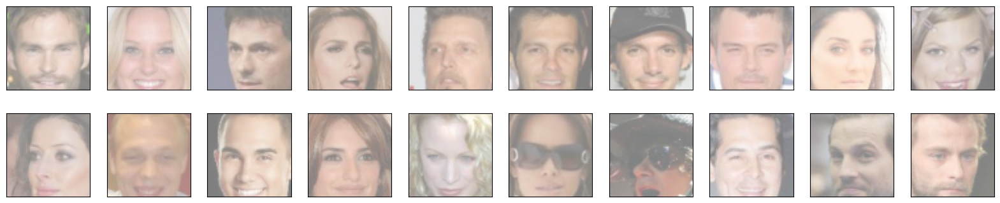

In [46]:
def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation


### the discriminator


In [113]:
from torch import nn

In [126]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x
        
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        # complete init function
        conv_dim = 64

        # 64x64 input
        self.conv1 = ConvBlock(3, conv_dim, 4, batch_norm=False) # first layer, no batch_norm
        # 32x32 input
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4) 
        # 16x16 out
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4)
        # 8x8 out
        self.conv4 = ConvBlock(conv_dim*4, conv_dim*8, 4)
        # 4x4 out
        
        self.flatten = nn.Flatten()
        # final, fully-connected layer
        self.fc = nn.Linear(conv_dim*4*4*4*2, 1)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        # flatten
        x = x.view(-1, 1,1, 64*4*2*4*4)
        # final output layer
        x = self.fc(x)    
        return x 

In [127]:
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


###  the generator



In [136]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x
        
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # transpose conv layers
        conv_dim = 64
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*8, 4, 1, 0)
        self.deconv2 = DeconvBlock(conv_dim*8, conv_dim*4, 4, 2, 1)
        self.deconv3 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.deconv4 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        x = self.last_activation(x)
        return x

In [140]:
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. 

### the optimizers

In [191]:
import torch.optim as optim

# params
lr = 0.0002
beta1=0.5
beta2=0.999 # default value

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

In [192]:
train_on_gpu = torch.cuda.is_available()

if train_on_gpu:
    # move models to GPU
    generator.cuda()
    discriminator.cuda()
    print('GPU available for training. Models moved to GPU')
else:
    print('Training on CPU.')
    

GPU available for training. Models moved to GPU


## Losses implementation


###  the generator loss

In [193]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

In [194]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    loss = real_loss(fake_logits)
    return loss

###  the discriminator loss


In [195]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    loss = fake_loss(fake_logits) + real_loss(real_logits)
    return loss

### the gradient Penalty


In [196]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO : implement the gradient penalty
    return gp

## Training


### the generator step and the discriminator step functions


In [215]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)

    
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()

    fake_images = generator(z)
    fake_logits = discriminator(fake_images)
    
    g_loss = generator_loss(fake_logits)
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    real_logits = discriminator(real_images)

    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z)
    fake_logits = discriminator(fake_images.detach())
    
    d_loss = discriminator_loss(real_logits, fake_logits)
    gp = gradient_penalty(discriminator, real_images, fake_images)
    return {'loss': d_loss, 'gp': gp}

### Main training loop



In [216]:
from datetime import datetime

In [224]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [225]:
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [226]:
def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### the training strategy


2023-12-26 21:45:07 | Epoch [1/20] | Batch 0/509 | d_loss: 1.5459 | g_loss: 2.1754
2023-12-26 21:45:08 | Epoch [1/20] | Batch 50/509 | d_loss: 0.0056 | g_loss: 8.0597
2023-12-26 21:45:09 | Epoch [1/20] | Batch 100/509 | d_loss: 5.5758 | g_loss: 10.3025
2023-12-26 21:45:10 | Epoch [1/20] | Batch 150/509 | d_loss: 0.2556 | g_loss: 8.2299
2023-12-26 21:45:12 | Epoch [1/20] | Batch 200/509 | d_loss: 0.4595 | g_loss: 3.0090
2023-12-26 21:45:13 | Epoch [1/20] | Batch 250/509 | d_loss: 0.3834 | g_loss: 2.5262
2023-12-26 21:45:14 | Epoch [1/20] | Batch 300/509 | d_loss: 0.1809 | g_loss: 3.4548
2023-12-26 21:45:15 | Epoch [1/20] | Batch 350/509 | d_loss: 0.9509 | g_loss: 3.4038
2023-12-26 21:45:17 | Epoch [1/20] | Batch 400/509 | d_loss: 0.3322 | g_loss: 2.2621
2023-12-26 21:45:18 | Epoch [1/20] | Batch 450/509 | d_loss: 0.1282 | g_loss: 3.5983
2023-12-26 21:45:19 | Epoch [1/20] | Batch 500/509 | d_loss: 0.1504 | g_loss: 4.3451


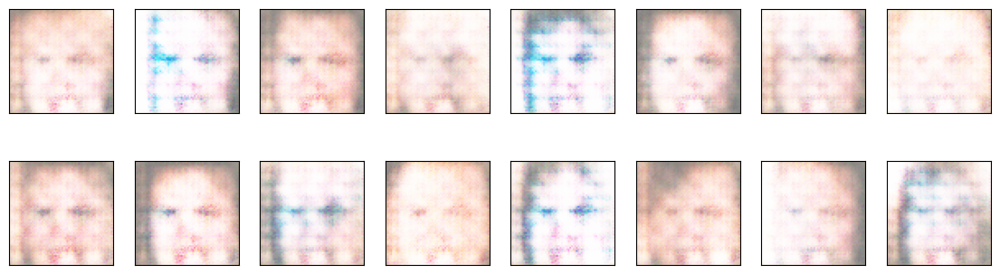

2023-12-26 21:45:20 | Epoch [2/20] | Batch 0/509 | d_loss: 0.3940 | g_loss: 5.1201
2023-12-26 21:45:21 | Epoch [2/20] | Batch 50/509 | d_loss: 0.6735 | g_loss: 6.2040
2023-12-26 21:45:22 | Epoch [2/20] | Batch 100/509 | d_loss: 1.1349 | g_loss: 1.0106
2023-12-26 21:45:24 | Epoch [2/20] | Batch 150/509 | d_loss: 0.4618 | g_loss: 6.2928
2023-12-26 21:45:25 | Epoch [2/20] | Batch 200/509 | d_loss: 0.2634 | g_loss: 1.8874
2023-12-26 21:45:26 | Epoch [2/20] | Batch 250/509 | d_loss: 0.5443 | g_loss: 3.9600
2023-12-26 21:45:27 | Epoch [2/20] | Batch 300/509 | d_loss: 0.1843 | g_loss: 4.4620
2023-12-26 21:45:29 | Epoch [2/20] | Batch 350/509 | d_loss: 0.0488 | g_loss: 3.3187
2023-12-26 21:45:30 | Epoch [2/20] | Batch 400/509 | d_loss: 0.7086 | g_loss: 0.9418
2023-12-26 21:45:31 | Epoch [2/20] | Batch 450/509 | d_loss: 0.5350 | g_loss: 3.0982
2023-12-26 21:45:32 | Epoch [2/20] | Batch 500/509 | d_loss: 0.3147 | g_loss: 2.8248


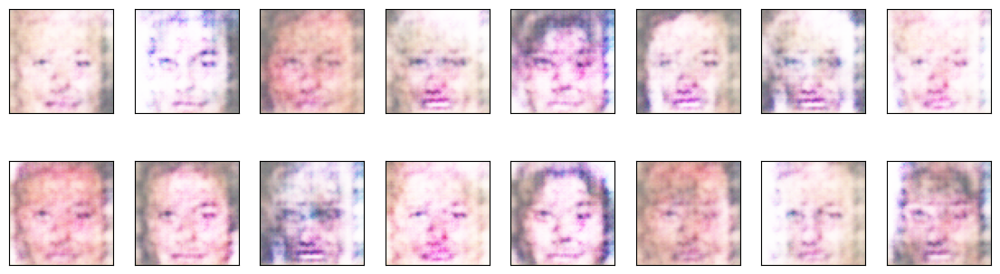

2023-12-26 21:45:33 | Epoch [3/20] | Batch 0/509 | d_loss: 0.6801 | g_loss: 7.6847
2023-12-26 21:45:34 | Epoch [3/20] | Batch 50/509 | d_loss: 0.5714 | g_loss: 4.0304
2023-12-26 21:45:36 | Epoch [3/20] | Batch 100/509 | d_loss: 0.5621 | g_loss: 4.9596
2023-12-26 21:45:37 | Epoch [3/20] | Batch 150/509 | d_loss: 0.3240 | g_loss: 5.2882
2023-12-26 21:45:38 | Epoch [3/20] | Batch 200/509 | d_loss: 0.6914 | g_loss: 1.4393
2023-12-26 21:45:39 | Epoch [3/20] | Batch 250/509 | d_loss: 0.6925 | g_loss: 3.9137
2023-12-26 21:45:41 | Epoch [3/20] | Batch 300/509 | d_loss: 0.4225 | g_loss: 1.9955
2023-12-26 21:45:42 | Epoch [3/20] | Batch 350/509 | d_loss: 0.3212 | g_loss: 2.4781
2023-12-26 21:45:43 | Epoch [3/20] | Batch 400/509 | d_loss: 0.1408 | g_loss: 2.9224
2023-12-26 21:45:44 | Epoch [3/20] | Batch 450/509 | d_loss: 0.5054 | g_loss: 2.8656
2023-12-26 21:45:46 | Epoch [3/20] | Batch 500/509 | d_loss: 0.2979 | g_loss: 3.6278


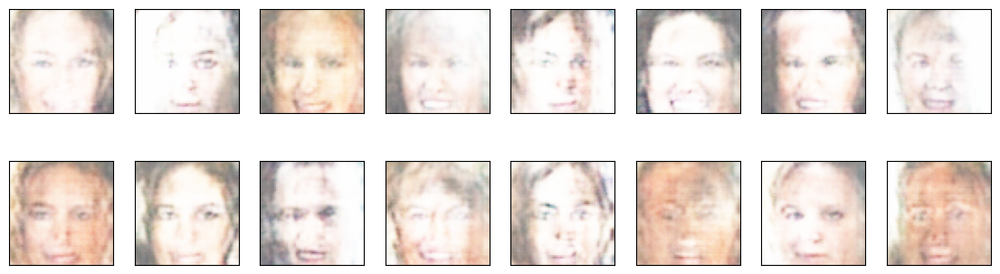

2023-12-26 21:45:46 | Epoch [4/20] | Batch 0/509 | d_loss: 0.3900 | g_loss: 2.4565
2023-12-26 21:45:48 | Epoch [4/20] | Batch 50/509 | d_loss: 0.1854 | g_loss: 3.5388
2023-12-26 21:45:49 | Epoch [4/20] | Batch 100/509 | d_loss: 0.2764 | g_loss: 3.4800
2023-12-26 21:45:50 | Epoch [4/20] | Batch 150/509 | d_loss: 0.6269 | g_loss: 4.9227
2023-12-26 21:45:51 | Epoch [4/20] | Batch 200/509 | d_loss: 0.2369 | g_loss: 2.7552
2023-12-26 21:45:53 | Epoch [4/20] | Batch 250/509 | d_loss: 0.2312 | g_loss: 3.1584
2023-12-26 21:45:54 | Epoch [4/20] | Batch 300/509 | d_loss: 0.6246 | g_loss: 4.3182
2023-12-26 21:45:55 | Epoch [4/20] | Batch 350/509 | d_loss: 0.9434 | g_loss: 2.8089
2023-12-26 21:45:56 | Epoch [4/20] | Batch 400/509 | d_loss: 0.1208 | g_loss: 3.7238
2023-12-26 21:45:58 | Epoch [4/20] | Batch 450/509 | d_loss: 0.3173 | g_loss: 4.4354
2023-12-26 21:45:59 | Epoch [4/20] | Batch 500/509 | d_loss: 0.6663 | g_loss: 3.5269


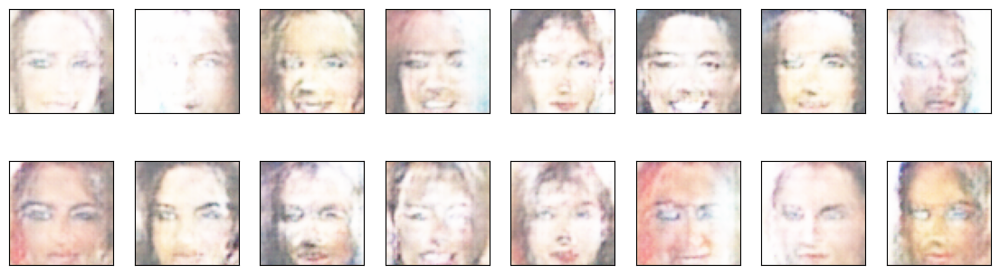

2023-12-26 21:46:00 | Epoch [5/20] | Batch 0/509 | d_loss: 0.1720 | g_loss: 3.1310
2023-12-26 21:46:01 | Epoch [5/20] | Batch 50/509 | d_loss: 0.2511 | g_loss: 4.9222
2023-12-26 21:46:02 | Epoch [5/20] | Batch 100/509 | d_loss: 0.3596 | g_loss: 3.8106
2023-12-26 21:46:03 | Epoch [5/20] | Batch 150/509 | d_loss: 0.1752 | g_loss: 2.7269
2023-12-26 21:46:05 | Epoch [5/20] | Batch 200/509 | d_loss: 0.0864 | g_loss: 3.7070
2023-12-26 21:46:06 | Epoch [5/20] | Batch 250/509 | d_loss: 1.7021 | g_loss: 8.5106
2023-12-26 21:46:07 | Epoch [5/20] | Batch 300/509 | d_loss: 0.3000 | g_loss: 4.5712
2023-12-26 21:46:08 | Epoch [5/20] | Batch 350/509 | d_loss: 0.5179 | g_loss: 4.4265
2023-12-26 21:46:10 | Epoch [5/20] | Batch 400/509 | d_loss: 0.7397 | g_loss: 5.9357
2023-12-26 21:46:11 | Epoch [5/20] | Batch 450/509 | d_loss: 0.6408 | g_loss: 3.3668
2023-12-26 21:46:12 | Epoch [5/20] | Batch 500/509 | d_loss: 0.2514 | g_loss: 3.4914


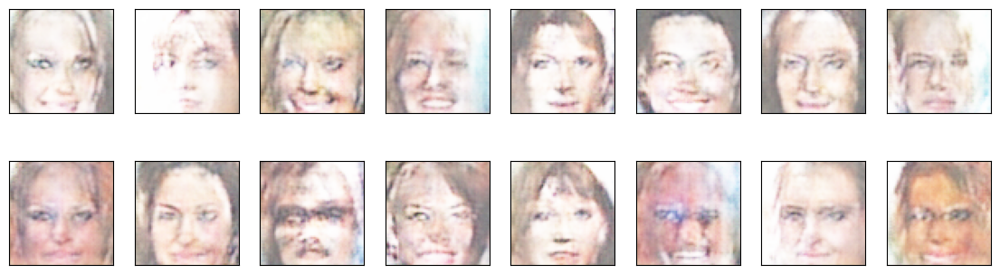

2023-12-26 21:46:13 | Epoch [6/20] | Batch 0/509 | d_loss: 0.1408 | g_loss: 4.2009
2023-12-26 21:46:14 | Epoch [6/20] | Batch 50/509 | d_loss: 1.1661 | g_loss: 6.3717
2023-12-26 21:46:15 | Epoch [6/20] | Batch 100/509 | d_loss: 0.2118 | g_loss: 3.0982
2023-12-26 21:46:17 | Epoch [6/20] | Batch 150/509 | d_loss: 0.0200 | g_loss: 4.6357
2023-12-26 21:46:18 | Epoch [6/20] | Batch 200/509 | d_loss: 0.0315 | g_loss: 8.1462
2023-12-26 21:46:19 | Epoch [6/20] | Batch 250/509 | d_loss: 0.0114 | g_loss: 6.1967
2023-12-26 21:46:20 | Epoch [6/20] | Batch 300/509 | d_loss: 0.1556 | g_loss: 3.7624
2023-12-26 21:46:22 | Epoch [6/20] | Batch 350/509 | d_loss: 0.2916 | g_loss: 7.3188
2023-12-26 21:46:23 | Epoch [6/20] | Batch 400/509 | d_loss: 0.5381 | g_loss: 5.0835
2023-12-26 21:46:24 | Epoch [6/20] | Batch 450/509 | d_loss: 2.2364 | g_loss: 9.3301
2023-12-26 21:46:26 | Epoch [6/20] | Batch 500/509 | d_loss: 0.3117 | g_loss: 7.7294


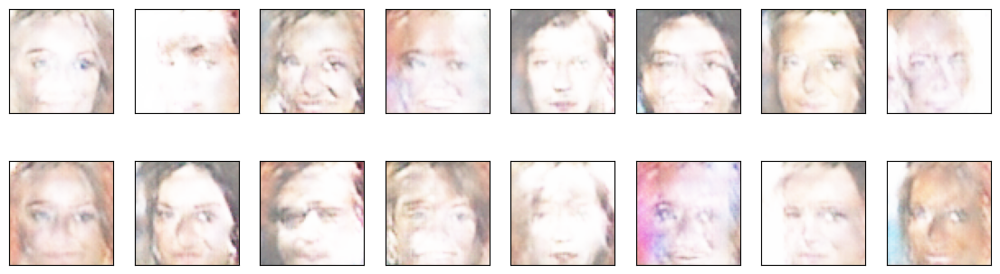

2023-12-26 21:46:26 | Epoch [7/20] | Batch 0/509 | d_loss: 0.0541 | g_loss: 4.1705
2023-12-26 21:46:27 | Epoch [7/20] | Batch 50/509 | d_loss: 0.0707 | g_loss: 5.1918
2023-12-26 21:46:29 | Epoch [7/20] | Batch 100/509 | d_loss: 0.0896 | g_loss: 3.8997
2023-12-26 21:46:30 | Epoch [7/20] | Batch 150/509 | d_loss: 0.0251 | g_loss: 6.9950
2023-12-26 21:46:31 | Epoch [7/20] | Batch 200/509 | d_loss: 0.0548 | g_loss: 4.1122
2023-12-26 21:46:32 | Epoch [7/20] | Batch 250/509 | d_loss: 0.4776 | g_loss: 4.0831
2023-12-26 21:46:34 | Epoch [7/20] | Batch 300/509 | d_loss: 0.0997 | g_loss: 3.0569
2023-12-26 21:46:35 | Epoch [7/20] | Batch 350/509 | d_loss: 0.0922 | g_loss: 3.2578
2023-12-26 21:46:36 | Epoch [7/20] | Batch 400/509 | d_loss: 0.1481 | g_loss: 3.3721
2023-12-26 21:46:38 | Epoch [7/20] | Batch 450/509 | d_loss: 0.0195 | g_loss: 4.6335
2023-12-26 21:46:39 | Epoch [7/20] | Batch 500/509 | d_loss: 0.0469 | g_loss: 3.6808


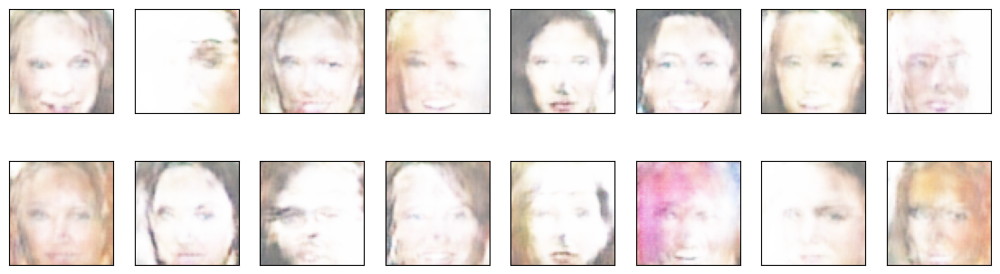

2023-12-26 21:46:40 | Epoch [8/20] | Batch 0/509 | d_loss: 0.7203 | g_loss: 6.6184
2023-12-26 21:46:41 | Epoch [8/20] | Batch 50/509 | d_loss: 0.0326 | g_loss: 7.1732
2023-12-26 21:46:42 | Epoch [8/20] | Batch 100/509 | d_loss: 0.0058 | g_loss: 6.3914
2023-12-26 21:46:43 | Epoch [8/20] | Batch 150/509 | d_loss: 0.2706 | g_loss: 4.7639
2023-12-26 21:46:45 | Epoch [8/20] | Batch 200/509 | d_loss: 0.1678 | g_loss: 6.1046
2023-12-26 21:46:46 | Epoch [8/20] | Batch 250/509 | d_loss: 0.0152 | g_loss: 4.5236
2023-12-26 21:46:47 | Epoch [8/20] | Batch 300/509 | d_loss: 0.1078 | g_loss: 3.4629
2023-12-26 21:46:48 | Epoch [8/20] | Batch 350/509 | d_loss: 0.0475 | g_loss: 5.5461
2023-12-26 21:46:50 | Epoch [8/20] | Batch 400/509 | d_loss: 0.0496 | g_loss: 4.0996
2023-12-26 21:46:51 | Epoch [8/20] | Batch 450/509 | d_loss: 0.1365 | g_loss: 5.3810
2023-12-26 21:46:52 | Epoch [8/20] | Batch 500/509 | d_loss: 0.0697 | g_loss: 3.9618


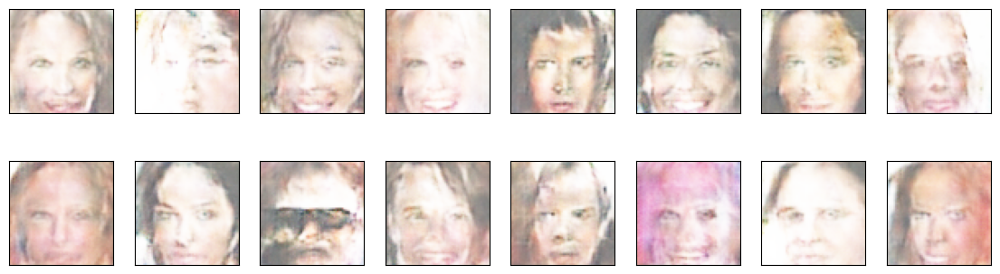

2023-12-26 21:46:53 | Epoch [9/20] | Batch 0/509 | d_loss: 0.0153 | g_loss: 5.1974
2023-12-26 21:46:54 | Epoch [9/20] | Batch 50/509 | d_loss: 0.3953 | g_loss: 6.9992
2023-12-26 21:46:55 | Epoch [9/20] | Batch 100/509 | d_loss: 0.3183 | g_loss: 4.3812
2023-12-26 21:46:57 | Epoch [9/20] | Batch 150/509 | d_loss: 0.4730 | g_loss: 3.2938
2023-12-26 21:46:58 | Epoch [9/20] | Batch 200/509 | d_loss: 0.0638 | g_loss: 3.3807
2023-12-26 21:46:59 | Epoch [9/20] | Batch 250/509 | d_loss: 0.0667 | g_loss: 7.9418
2023-12-26 21:47:00 | Epoch [9/20] | Batch 300/509 | d_loss: 0.6573 | g_loss: 1.9968
2023-12-26 21:47:02 | Epoch [9/20] | Batch 350/509 | d_loss: 0.0908 | g_loss: 5.5953
2023-12-26 21:47:03 | Epoch [9/20] | Batch 400/509 | d_loss: 0.1693 | g_loss: 2.7804
2023-12-26 21:47:04 | Epoch [9/20] | Batch 450/509 | d_loss: 0.2798 | g_loss: 5.5802
2023-12-26 21:47:05 | Epoch [9/20] | Batch 500/509 | d_loss: 1.1034 | g_loss: 3.8830


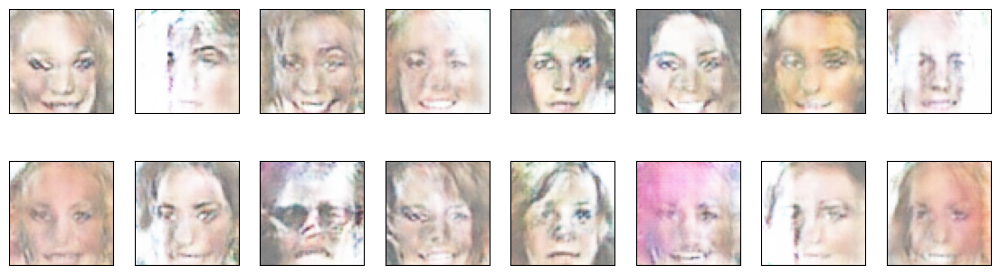

2023-12-26 21:47:06 | Epoch [10/20] | Batch 0/509 | d_loss: 0.4766 | g_loss: 8.8687
2023-12-26 21:47:07 | Epoch [10/20] | Batch 50/509 | d_loss: 0.2805 | g_loss: 3.9349
2023-12-26 21:47:09 | Epoch [10/20] | Batch 100/509 | d_loss: 0.0773 | g_loss: 3.2978
2023-12-26 21:47:10 | Epoch [10/20] | Batch 150/509 | d_loss: 0.0499 | g_loss: 4.4453
2023-12-26 21:47:11 | Epoch [10/20] | Batch 200/509 | d_loss: 0.2028 | g_loss: 4.2253
2023-12-26 21:47:12 | Epoch [10/20] | Batch 250/509 | d_loss: 0.1546 | g_loss: 4.1584
2023-12-26 21:47:14 | Epoch [10/20] | Batch 300/509 | d_loss: 0.1156 | g_loss: 3.3174
2023-12-26 21:47:15 | Epoch [10/20] | Batch 350/509 | d_loss: 0.0334 | g_loss: 5.4261
2023-12-26 21:47:16 | Epoch [10/20] | Batch 400/509 | d_loss: 0.0230 | g_loss: 5.4884
2023-12-26 21:47:18 | Epoch [10/20] | Batch 450/509 | d_loss: 0.1400 | g_loss: 4.8793
2023-12-26 21:47:19 | Epoch [10/20] | Batch 500/509 | d_loss: 0.0304 | g_loss: 7.1089


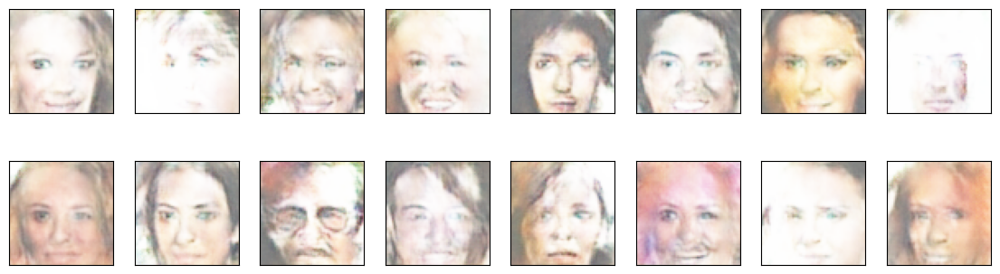

2023-12-26 21:47:19 | Epoch [11/20] | Batch 0/509 | d_loss: 0.2357 | g_loss: 3.6099
2023-12-26 21:47:21 | Epoch [11/20] | Batch 50/509 | d_loss: 0.3062 | g_loss: 6.1599
2023-12-26 21:47:22 | Epoch [11/20] | Batch 100/509 | d_loss: 0.6849 | g_loss: 6.0473
2023-12-26 21:47:23 | Epoch [11/20] | Batch 150/509 | d_loss: 0.2135 | g_loss: 4.6389
2023-12-26 21:47:24 | Epoch [11/20] | Batch 200/509 | d_loss: 1.2004 | g_loss: 10.8938
2023-12-26 21:47:26 | Epoch [11/20] | Batch 250/509 | d_loss: 0.2219 | g_loss: 4.8281
2023-12-26 21:47:27 | Epoch [11/20] | Batch 300/509 | d_loss: 0.0935 | g_loss: 4.7918
2023-12-26 21:47:28 | Epoch [11/20] | Batch 350/509 | d_loss: 0.2226 | g_loss: 5.1881
2023-12-26 21:47:30 | Epoch [11/20] | Batch 400/509 | d_loss: 0.0723 | g_loss: 5.0595
2023-12-26 21:47:31 | Epoch [11/20] | Batch 450/509 | d_loss: 0.5208 | g_loss: 2.8695
2023-12-26 21:47:32 | Epoch [11/20] | Batch 500/509 | d_loss: 0.3330 | g_loss: 8.6411


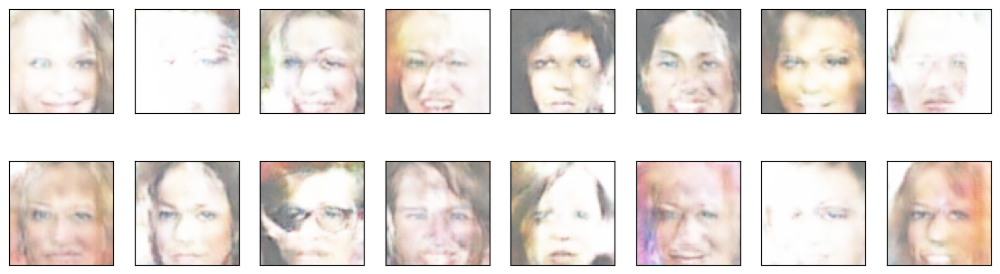

2023-12-26 21:47:33 | Epoch [12/20] | Batch 0/509 | d_loss: 5.4520 | g_loss: 6.6698
2023-12-26 21:47:34 | Epoch [12/20] | Batch 50/509 | d_loss: 0.0269 | g_loss: 4.5465
2023-12-26 21:47:35 | Epoch [12/20] | Batch 100/509 | d_loss: 0.1467 | g_loss: 5.0346
2023-12-26 21:47:36 | Epoch [12/20] | Batch 150/509 | d_loss: 0.0726 | g_loss: 5.7251
2023-12-26 21:47:38 | Epoch [12/20] | Batch 200/509 | d_loss: 0.0173 | g_loss: 5.3031
2023-12-26 21:47:39 | Epoch [12/20] | Batch 250/509 | d_loss: 2.0136 | g_loss: 3.6293
2023-12-26 21:47:40 | Epoch [12/20] | Batch 300/509 | d_loss: 0.1240 | g_loss: 5.3804
2023-12-26 21:47:42 | Epoch [12/20] | Batch 350/509 | d_loss: 0.2762 | g_loss: 7.8350
2023-12-26 21:47:43 | Epoch [12/20] | Batch 400/509 | d_loss: 0.3184 | g_loss: 7.7694
2023-12-26 21:47:44 | Epoch [12/20] | Batch 450/509 | d_loss: 0.4107 | g_loss: 5.3579
2023-12-26 21:47:45 | Epoch [12/20] | Batch 500/509 | d_loss: 0.0293 | g_loss: 5.4617


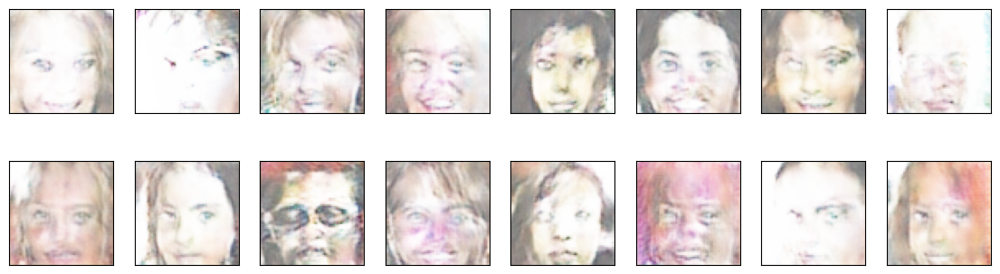

2023-12-26 21:47:46 | Epoch [13/20] | Batch 0/509 | d_loss: 0.2058 | g_loss: 3.3634
2023-12-26 21:47:47 | Epoch [13/20] | Batch 50/509 | d_loss: 0.2346 | g_loss: 5.6873
2023-12-26 21:47:49 | Epoch [13/20] | Batch 100/509 | d_loss: 0.7026 | g_loss: 7.5371
2023-12-26 21:47:50 | Epoch [13/20] | Batch 150/509 | d_loss: 0.1100 | g_loss: 2.7730
2023-12-26 21:47:51 | Epoch [13/20] | Batch 200/509 | d_loss: 0.0890 | g_loss: 5.0213
2023-12-26 21:47:52 | Epoch [13/20] | Batch 250/509 | d_loss: 0.2547 | g_loss: 3.9752
2023-12-26 21:47:54 | Epoch [13/20] | Batch 300/509 | d_loss: 0.0203 | g_loss: 5.4174
2023-12-26 21:47:55 | Epoch [13/20] | Batch 350/509 | d_loss: 0.1021 | g_loss: 3.1767
2023-12-26 21:47:56 | Epoch [13/20] | Batch 400/509 | d_loss: 0.2581 | g_loss: 2.9078
2023-12-26 21:47:57 | Epoch [13/20] | Batch 450/509 | d_loss: 0.1456 | g_loss: 5.6699
2023-12-26 21:47:59 | Epoch [13/20] | Batch 500/509 | d_loss: 0.5532 | g_loss: 8.6835


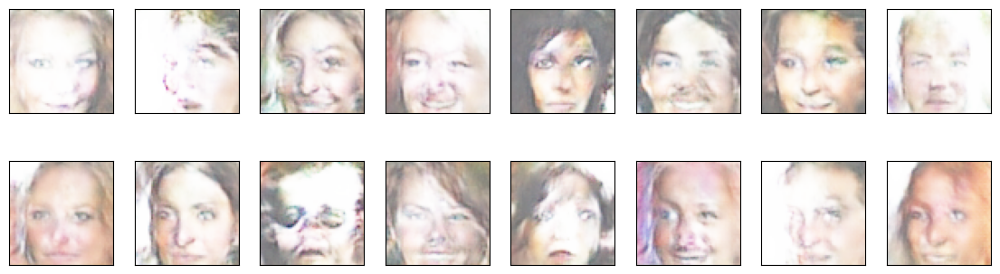

2023-12-26 21:47:59 | Epoch [14/20] | Batch 0/509 | d_loss: 0.1394 | g_loss: 5.0536
2023-12-26 21:48:01 | Epoch [14/20] | Batch 50/509 | d_loss: 0.0129 | g_loss: 5.6697
2023-12-26 21:48:02 | Epoch [14/20] | Batch 100/509 | d_loss: 0.1749 | g_loss: 6.5787
2023-12-26 21:48:03 | Epoch [14/20] | Batch 150/509 | d_loss: 0.0228 | g_loss: 6.9450
2023-12-26 21:48:04 | Epoch [14/20] | Batch 200/509 | d_loss: 0.3451 | g_loss: 6.3891
2023-12-26 21:48:06 | Epoch [14/20] | Batch 250/509 | d_loss: 0.0378 | g_loss: 4.9661
2023-12-26 21:48:07 | Epoch [14/20] | Batch 300/509 | d_loss: 0.0530 | g_loss: 4.3278
2023-12-26 21:48:08 | Epoch [14/20] | Batch 350/509 | d_loss: 0.0055 | g_loss: 4.5357
2023-12-26 21:48:10 | Epoch [14/20] | Batch 400/509 | d_loss: 0.0225 | g_loss: 6.8424
2023-12-26 21:48:11 | Epoch [14/20] | Batch 450/509 | d_loss: 0.0645 | g_loss: 4.7424
2023-12-26 21:48:12 | Epoch [14/20] | Batch 500/509 | d_loss: 0.1003 | g_loss: 3.3375


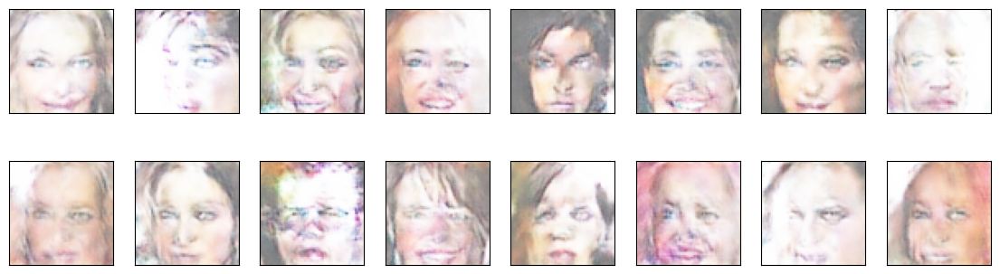

2023-12-26 21:48:13 | Epoch [15/20] | Batch 0/509 | d_loss: 0.0572 | g_loss: 5.4847
2023-12-26 21:48:14 | Epoch [15/20] | Batch 50/509 | d_loss: 0.3064 | g_loss: 4.6189
2023-12-26 21:48:15 | Epoch [15/20] | Batch 100/509 | d_loss: 0.0451 | g_loss: 6.4865
2023-12-26 21:48:17 | Epoch [15/20] | Batch 150/509 | d_loss: 0.1249 | g_loss: 3.7449
2023-12-26 21:48:18 | Epoch [15/20] | Batch 200/509 | d_loss: 0.3978 | g_loss: 7.6340
2023-12-26 21:48:19 | Epoch [15/20] | Batch 250/509 | d_loss: 0.0423 | g_loss: 4.3221
2023-12-26 21:48:20 | Epoch [15/20] | Batch 300/509 | d_loss: 0.0342 | g_loss: 4.8251
2023-12-26 21:48:22 | Epoch [15/20] | Batch 350/509 | d_loss: 0.0840 | g_loss: 5.0931
2023-12-26 21:48:23 | Epoch [15/20] | Batch 400/509 | d_loss: 0.0285 | g_loss: 4.3328
2023-12-26 21:48:24 | Epoch [15/20] | Batch 450/509 | d_loss: 0.0137 | g_loss: 9.0695
2023-12-26 21:48:25 | Epoch [15/20] | Batch 500/509 | d_loss: 0.0183 | g_loss: 3.1802


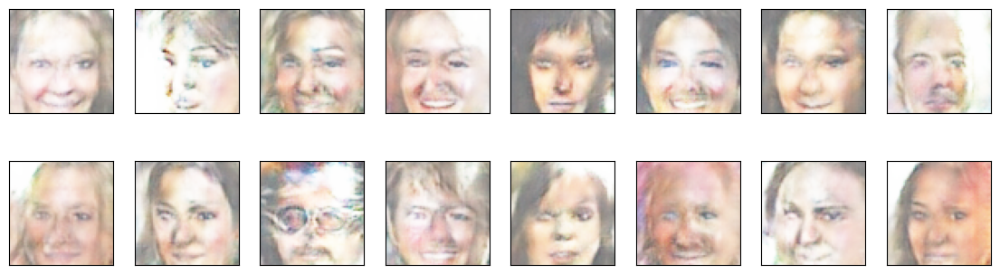

2023-12-26 21:48:26 | Epoch [16/20] | Batch 0/509 | d_loss: 0.0914 | g_loss: 6.9190
2023-12-26 21:48:27 | Epoch [16/20] | Batch 50/509 | d_loss: 0.0965 | g_loss: 1.6359
2023-12-26 21:48:29 | Epoch [16/20] | Batch 100/509 | d_loss: 0.0284 | g_loss: 5.9459
2023-12-26 21:48:30 | Epoch [16/20] | Batch 150/509 | d_loss: 0.3029 | g_loss: 5.3597
2023-12-26 21:48:31 | Epoch [16/20] | Batch 200/509 | d_loss: 0.0572 | g_loss: 3.7426
2023-12-26 21:48:32 | Epoch [16/20] | Batch 250/509 | d_loss: 0.0149 | g_loss: 4.6795
2023-12-26 21:48:34 | Epoch [16/20] | Batch 300/509 | d_loss: 0.0109 | g_loss: 5.2890
2023-12-26 21:48:35 | Epoch [16/20] | Batch 350/509 | d_loss: 0.0266 | g_loss: 7.4417
2023-12-26 21:48:36 | Epoch [16/20] | Batch 400/509 | d_loss: 0.0558 | g_loss: 3.1892
2023-12-26 21:48:37 | Epoch [16/20] | Batch 450/509 | d_loss: 0.3198 | g_loss: 9.0454
2023-12-26 21:48:39 | Epoch [16/20] | Batch 500/509 | d_loss: 0.0475 | g_loss: 3.1842


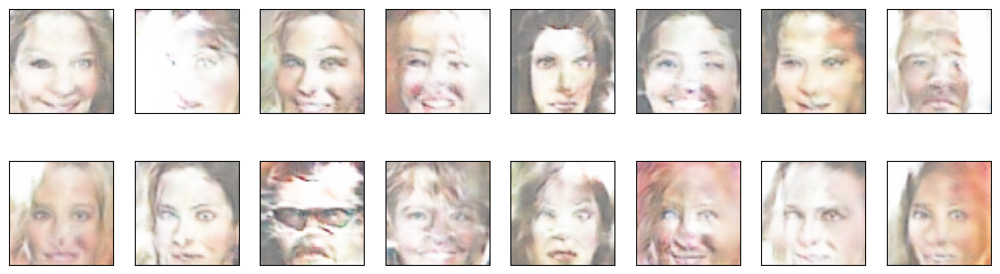

2023-12-26 21:48:39 | Epoch [17/20] | Batch 0/509 | d_loss: 0.0199 | g_loss: 6.0737
2023-12-26 21:48:41 | Epoch [17/20] | Batch 50/509 | d_loss: 0.0409 | g_loss: 4.9192
2023-12-26 21:48:42 | Epoch [17/20] | Batch 100/509 | d_loss: 0.1629 | g_loss: 5.6301
2023-12-26 21:48:43 | Epoch [17/20] | Batch 150/509 | d_loss: 0.0462 | g_loss: 4.3772
2023-12-26 21:48:44 | Epoch [17/20] | Batch 200/509 | d_loss: 0.1562 | g_loss: 4.3099
2023-12-26 21:48:46 | Epoch [17/20] | Batch 250/509 | d_loss: 0.0585 | g_loss: 5.4778
2023-12-26 21:48:47 | Epoch [17/20] | Batch 300/509 | d_loss: 0.0409 | g_loss: 6.6501
2023-12-26 21:48:48 | Epoch [17/20] | Batch 350/509 | d_loss: 2.6691 | g_loss: 5.6651
2023-12-26 21:48:49 | Epoch [17/20] | Batch 400/509 | d_loss: 2.0937 | g_loss: 4.5350
2023-12-26 21:48:51 | Epoch [17/20] | Batch 450/509 | d_loss: 0.0114 | g_loss: 7.4994
2023-12-26 21:48:52 | Epoch [17/20] | Batch 500/509 | d_loss: 0.0848 | g_loss: 3.3862


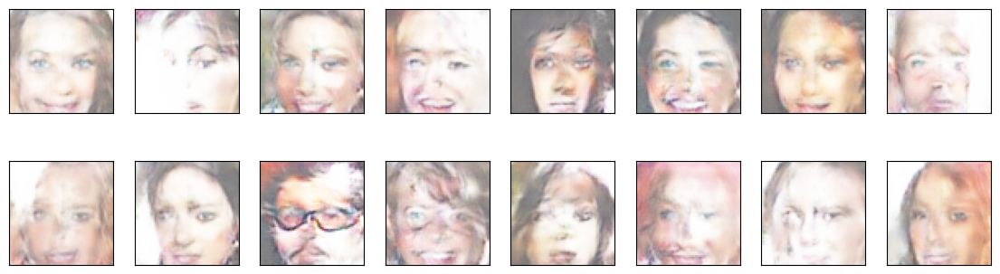

2023-12-26 21:48:53 | Epoch [18/20] | Batch 0/509 | d_loss: 0.1098 | g_loss: 4.9014
2023-12-26 21:48:54 | Epoch [18/20] | Batch 50/509 | d_loss: 0.0175 | g_loss: 4.6386
2023-12-26 21:48:55 | Epoch [18/20] | Batch 100/509 | d_loss: 0.1074 | g_loss: 5.5631
2023-12-26 21:48:56 | Epoch [18/20] | Batch 150/509 | d_loss: 0.0347 | g_loss: 7.3545
2023-12-26 21:48:58 | Epoch [18/20] | Batch 200/509 | d_loss: 0.0308 | g_loss: 6.9989
2023-12-26 21:48:59 | Epoch [18/20] | Batch 250/509 | d_loss: 0.0166 | g_loss: 4.7326
2023-12-26 21:49:00 | Epoch [18/20] | Batch 300/509 | d_loss: 0.0724 | g_loss: 3.0104
2023-12-26 21:49:01 | Epoch [18/20] | Batch 350/509 | d_loss: 0.0828 | g_loss: 4.7151
2023-12-26 21:49:03 | Epoch [18/20] | Batch 400/509 | d_loss: 0.0540 | g_loss: 5.7600
2023-12-26 21:49:04 | Epoch [18/20] | Batch 450/509 | d_loss: 0.0515 | g_loss: 3.7533
2023-12-26 21:49:05 | Epoch [18/20] | Batch 500/509 | d_loss: 0.0646 | g_loss: 4.6271


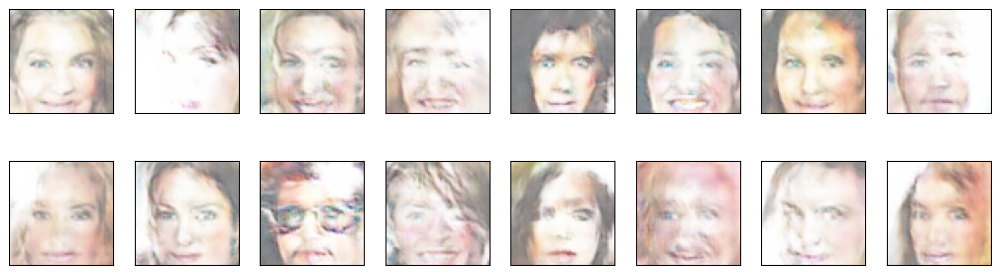

2023-12-26 21:49:06 | Epoch [19/20] | Batch 0/509 | d_loss: 0.7475 | g_loss: 3.0351
2023-12-26 21:49:07 | Epoch [19/20] | Batch 50/509 | d_loss: 0.0317 | g_loss: 5.4633
2023-12-26 21:49:09 | Epoch [19/20] | Batch 100/509 | d_loss: 0.1330 | g_loss: 4.8705
2023-12-26 21:49:10 | Epoch [19/20] | Batch 150/509 | d_loss: 0.0957 | g_loss: 6.8353
2023-12-26 21:49:11 | Epoch [19/20] | Batch 200/509 | d_loss: 0.2103 | g_loss: 4.7848
2023-12-26 21:49:12 | Epoch [19/20] | Batch 250/509 | d_loss: 0.0633 | g_loss: 6.1007
2023-12-26 21:49:14 | Epoch [19/20] | Batch 300/509 | d_loss: 0.0997 | g_loss: 4.8943
2023-12-26 21:49:15 | Epoch [19/20] | Batch 350/509 | d_loss: 0.2736 | g_loss: 3.9692
2023-12-26 21:49:16 | Epoch [19/20] | Batch 400/509 | d_loss: 0.0432 | g_loss: 5.4353
2023-12-26 21:49:17 | Epoch [19/20] | Batch 450/509 | d_loss: 0.0463 | g_loss: 6.2342
2023-12-26 21:49:19 | Epoch [19/20] | Batch 500/509 | d_loss: 0.0190 | g_loss: 6.4030


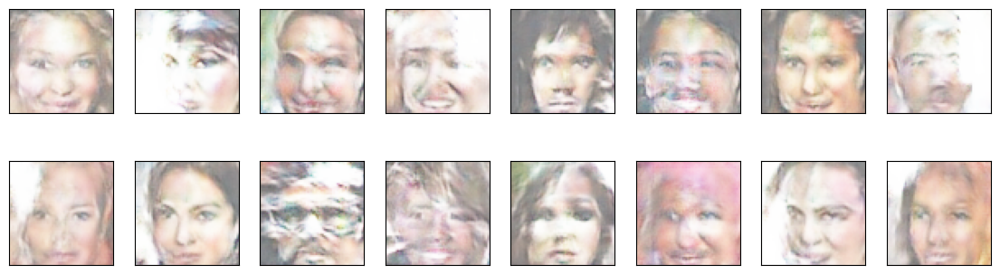

2023-12-26 21:49:19 | Epoch [20/20] | Batch 0/509 | d_loss: 0.0582 | g_loss: 5.3298
2023-12-26 21:49:21 | Epoch [20/20] | Batch 50/509 | d_loss: 0.0610 | g_loss: 5.7216
2023-12-26 21:49:22 | Epoch [20/20] | Batch 100/509 | d_loss: 0.0357 | g_loss: 6.2008
2023-12-26 21:49:23 | Epoch [20/20] | Batch 150/509 | d_loss: 0.3232 | g_loss: 4.0367
2023-12-26 21:49:24 | Epoch [20/20] | Batch 200/509 | d_loss: 0.0402 | g_loss: 6.9518
2023-12-26 21:49:26 | Epoch [20/20] | Batch 250/509 | d_loss: 0.3272 | g_loss: 2.4275
2023-12-26 21:49:27 | Epoch [20/20] | Batch 300/509 | d_loss: 0.0313 | g_loss: 4.5346
2023-12-26 21:49:28 | Epoch [20/20] | Batch 350/509 | d_loss: 0.5251 | g_loss: 11.4258
2023-12-26 21:49:29 | Epoch [20/20] | Batch 400/509 | d_loss: 0.1311 | g_loss: 9.1653
2023-12-26 21:49:31 | Epoch [20/20] | Batch 450/509 | d_loss: 0.0621 | g_loss: 6.7774
2023-12-26 21:49:32 | Epoch [20/20] | Batch 500/509 | d_loss: 0.2600 | g_loss: 3.9421


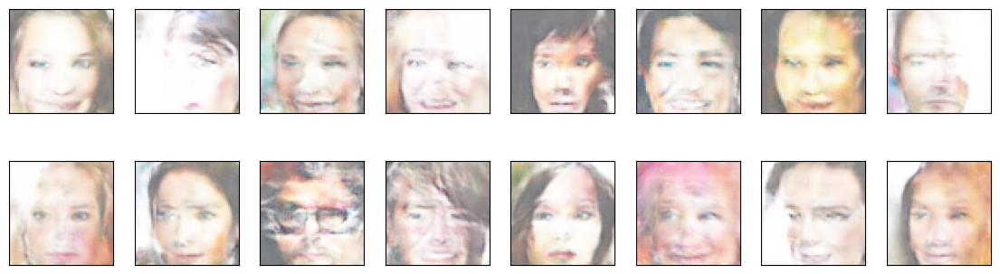

In [227]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.float().to(device)
        
        ####################################
        
        # the training strategy
        
        ####################################
        d_optimizer.zero_grad()
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        d_loss['loss'].backward()
        d_optimizer.step()

        g_optimizer.zero_grad()
        g_loss = generator_step(batch_size, latent_dim)
        g_loss["loss"].backward()
        g_optimizer.step()
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

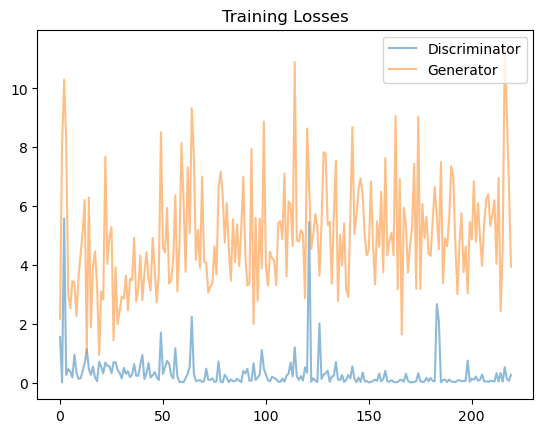

In [228]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()